In [1]:
from matplotlib import pyplot as plt 
import time
import numpy as np 
import pandas as pd 
from sklearn.metrics.pairwise import pairwise_distances 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
from sklearn.manifold import TSNE
from sklearn import preprocessing
from scipy.signal import find_peaks
import warnings
warnings.filterwarnings("ignore")
import ils.cfsdp as cfs
import ils.utils as ut
import ils.basic_ils as ils
from sklearn.metrics.pairwise import pairwise_distances
from scipy.cluster.hierarchy import dendrogram, linkage, cut_tree
from sklearn.cluster import AgglomerativeClustering
from sklearn import decomposition as skldec
import ils.dirichletMixtures as dm
import ils.agglomerativeClustering as hc
import random

In [2]:
from sklearn import cluster, datasets, mixture

N = 1500
noisy_circles = datasets.make_circles(n_samples=N, factor=.5, noise=.05)
noisy_moons = datasets.make_moons(n_samples=N, noise=.05)
blobs = datasets.make_blobs(n_samples=N, random_state=8)
no_structure = np.random.rand(N, 2), None
# Anisotropicly distributed data
RS = 170 
X, y = datasets.make_blobs(n_samples=N, random_state= RS)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)
# blobs with varied variances
varied = datasets.make_blobs(n_samples=N,
                             cluster_std=[1.0, 2.5, 0.5],
                             random_state=RS)

# data including x,y points and true labels
ds = [ noisy_circles, noisy_moons, varied, aniso, blobs, no_structure ] 

# scale and store points only in a list of dataFrames 
features = ['x','y']
X = []
for i,j in enumerate(ds) :
    X.append( pd.DataFrame(StandardScaler().fit_transform(j[0])
                ,columns = features) )
    X[i].index.name = 'ID'

# Set consistant coloring for plotting 
# The cycling is only needed if many clusters are identified
from itertools import cycle, islice
colors = np.array(list(islice(cycle(
        ['#837E7C','#377eb8', '#ff7f00', 
         '#4daf4a','#f781bf', '#a65628', 
         '#984ea3','#999999', '#e41a1c', '#dede00']
         ),int(10))))

In [3]:
ds_name = [ 'noisy_circles', 'noisy_moons', 'varied', 'aniso', 'blobs', 'no_structure' ] 

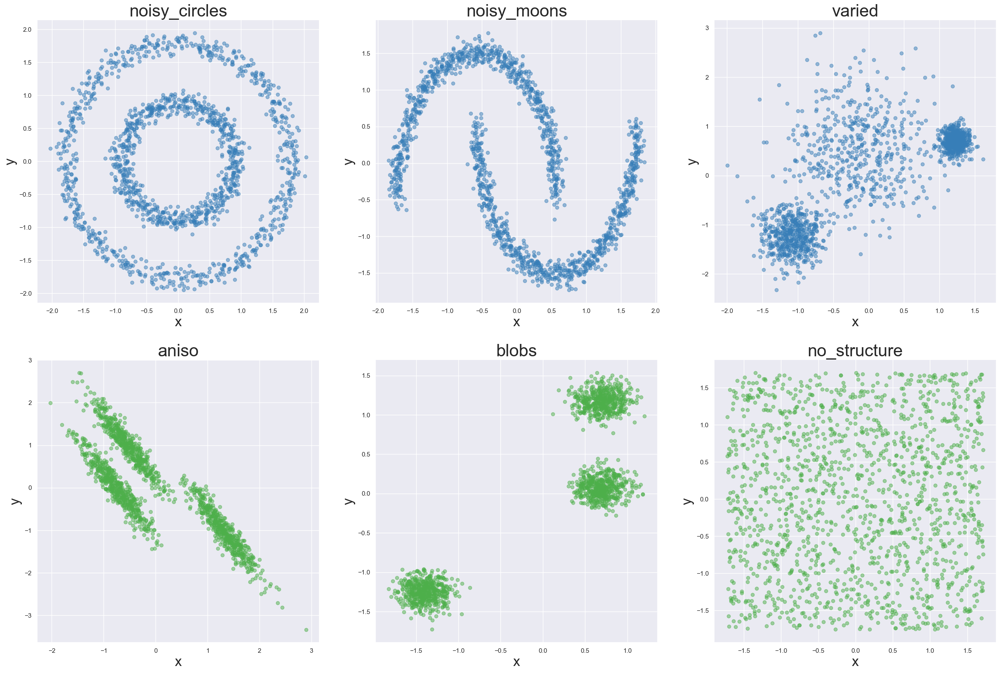

In [4]:
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
fig, axs = plt.subplots(2,3, figsize=(30,20),dpi=100)

for i in range(len(X)):
    if i < 3:
        axs[0,i].scatter(X[i]['x'], X[i]['y'], c=ut.colors[1], alpha=0.5)
        axs[0,i].set_title(ds_name[i])
        axs[0,i].set_xlabel('x')
        axs[0,i].set_ylabel('y')
    else:
        axs[1,i-3].scatter(X[i]['x'], X[i]['y'], c=ut.colors[2], alpha=0.5)
        axs[1,i-3].set_title(ds_name[i])
        axs[1,i-3].set_xlabel('x')
        axs[1,i-3].set_ylabel('y')

In [5]:
ag_data = pd.read_csv("dataset/Ag_features_normalised.csv")
shape = ag_data['shape']
ag_data = ag_data[['popFCC', 'popHCP', 'popICOS', 'SCN3', 'SCN4', 'SCN5', 
'SCN6', 'SCN7', 'SCN8', 'SCN9', 'SCN10', 'popSurface', 'coordNumberNormalised']]
nd_data = pd.read_csv('dataset/ND_finalClusters.csv')
df = nd_data.copy()
nd_data = nd_data[['H_conc', 'HCP_conc', 'FCC_conc', 'F_111', 'F_110', 'F_100',
       'Sphericity', 'CC_coord', 'sp1', 'sp2', 'sp2x', 'sp3', 'dCC', 'dCCe',
       'aCCC', 'aCCCe', 'D_nm']]

In [6]:
X_embedded_ag = ag_data.copy()
X_embedded_ag = TSNE(n_components=2, perplexity=30, random_state=42, verbose=1).fit_transform(X_embedded_ag)
X_embedded_ag = pd.DataFrame(X_embedded_ag, columns = ['x', 'y'])
X_embedded_nd = nd_data.copy()
X_embedded_nd = TSNE(n_components=2, perplexity=30, random_state=42, verbose=1).fit_transform(X_embedded_nd)
X_embedded_nd = pd.DataFrame(X_embedded_nd, columns = ['x', 'y'])

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 425 samples in 0.001s...
[t-SNE] Computed neighbors for 425 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 425 / 425
[t-SNE] Mean sigma: 0.112412
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.100662
[t-SNE] KL divergence after 1000 iterations: 0.403229
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.000s...
[t-SNE] Computed neighbors for 500 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.267793
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.400772
[t-SNE] KL divergence after 1000 iterations: 0.221010


In [17]:
def test_hc(dataset, k, X_embedded, low=60, high=95):
    Z = hc.get_linkage(dataset, method='single', metric='euclidean')
    label = hc.choose_best_cut(Z, k, low=low, high=high)
    ac, remain = hc.split_data(label, k)
    index = []
    for i in range(len(ac)):
        index.append(random.choice(ac[i]))
    print(index)
    newL, count = cfs.applyILS(dataset, index)
    return newL, count, index

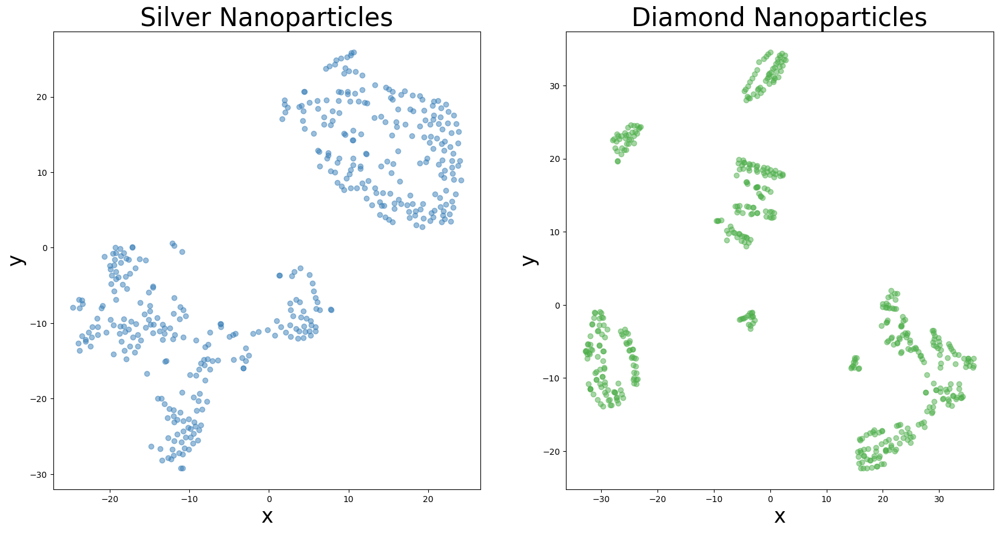

In [60]:
plt.figure(figsize=(20, 10),dpi=100)
ax1 = plt.subplot(121)
plt.scatter(x=X_embedded_ag['x'], y=X_embedded_ag['y'], c=ut.colors[1], alpha=0.5)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Silver Nanoparticles')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(x=X_embedded_nd['x'], y=X_embedded_nd['y'], c=ut.colors[2], alpha=0.5)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Diamond Nanoparticles')
plt.sca(ax2)
plt.show()


In [68]:
pca_1 = skldec.PCA(n_components = 2)    
pca_1.fit(ag_data)  
result_ag = pca_1.transform(ag_data)  
pca_2 = skldec.PCA(n_components = 2)    
pca_2.fit(nd_data)  
result_nd = pca_2.transform(nd_data)  

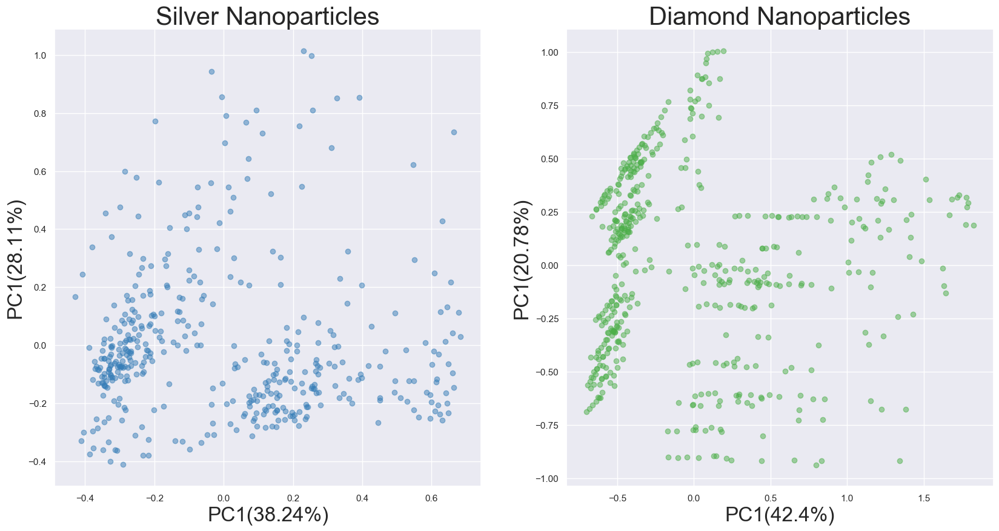

In [70]:
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 10),dpi=100)
ax1 = plt.subplot(121)
plt.scatter(result_ag[:, 0], result_ag[:, 1], c=ut.colors[1], alpha=0.5)
x_label = 'PC1(%s%%)' % round((pca_1.explained_variance_ratio_[0]*100.0),2)   
y_label = 'PC1(%s%%)' % round((pca_1.explained_variance_ratio_[1]*100.0),2)   
plt.xlabel(x_label)    
plt.ylabel(y_label)    
plt.title('Silver Nanoparticles')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(result_nd[:, 0], result_nd[:, 1], c=ut.colors[2], alpha=0.5)
x_label = 'PC1(%s%%)' % round((pca_2.explained_variance_ratio_[0]*100.0),2)   
y_label = 'PC1(%s%%)' % round((pca_2.explained_variance_ratio_[1]*100.0),2)   
plt.xlabel(x_label)    
plt.ylabel(y_label)    
plt.title('Diamond Nanoparticles')
plt.sca(ax2)
plt.show()

In [7]:
def pre_calculate(data):
    start = time.time()
    distance_matrix = pairwise_distances(data)
    dc, dc_value_list, field = cfs.choose_dc(distance_matrix)
    print(dc)
    density = cfs.continuous_density(distance_matrix, dc)
    delta_matrix = cfs.delta_function(distance_matrix, density) 
    scores = cfs.choosing_centernumber(density, delta_matrix)
    end = time.time()
    print('Density caluation time {}'.format(end-start))
    return scores, density, delta_matrix

In [8]:
scores, density, delta_matrix = pre_calculate(nd_data)

0.5356869554443542
Density caluation time 0.6069042682647705


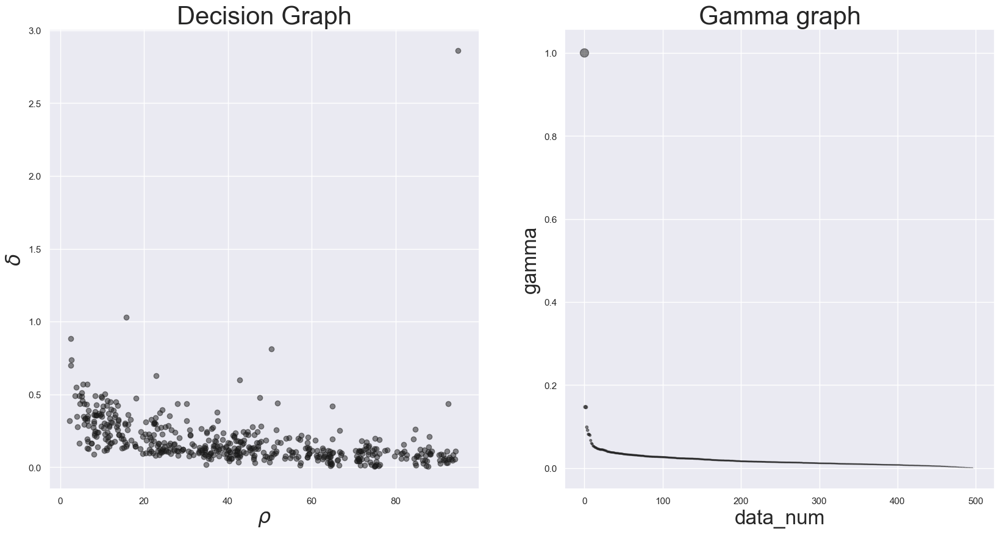

In [167]:
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 10),dpi=100)
ax1 = plt.subplot(121)
for i in range(len(nd_data)):
    plt.scatter(x=density[i], y=delta_matrix[i], c='k', marker='o', alpha=0.5)
plt.xlabel(r"$\rho$")
plt.ylabel(r"$\delta$")
plt.title('Decision Graph')
plt.sca(ax1)

ax2 = plt.subplot(122)
gamma = scores
plt.scatter(x=range(len(delta_matrix)), y=-np.sort(-gamma), c='k', marker='o', s=-np.sort(-gamma) * 100, alpha=0.5)
plt.xlabel('data_num')
plt.ylabel('gamma')
plt.title('Gamma graph')
plt.sca(ax2)
plt.show()

0.5356869554443542
Density caluation time 0.7016699314117432
The number of clusters: 9
Iterative label spreading took 1.5s to label 500 points


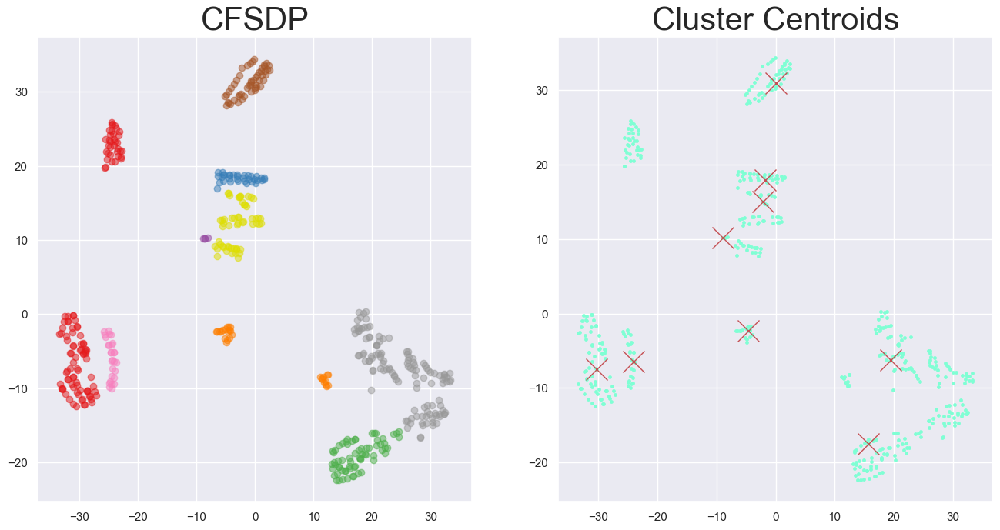

In [21]:
t = nd_data
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 9)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
X_embedded_nd.index.name = 'ID'
df2 = pd.merge(X_embedded_nd, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(X_embedded_nd['x'], X_embedded_nd['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(X_embedded_nd.loc[i][0], X_embedded_nd.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

In [22]:
from sklearn.metrics.cluster import adjusted_rand_score
LS = np.array(df2['LS'])
ILS1 = np.array(df['ILS1'])
adjusted_rand_score(LS, ILS1)

0.3570746411599496

In [23]:
LS = np.array(df2['LS'])
ILS2 = np.array(df['ILS2'])
adjusted_rand_score(LS, ILS2)

0.4729976661838128

In [24]:
LS = np.array(df2['LS'])
ILS3 = np.array(df['clusterID'])
adjusted_rand_score(LS, ILS3)

0.7477411974902143

In [25]:
LS = np.array(df2['LS'])
ILS1 = np.array(df['ILS1'])
print(rand_score(ILS1, LS))
LS = np.array(df2['LS'])
ILS2 = np.array(df['ILS2'])
print(rand_score(ILS2, LS))
LS = np.array(df2['LS'])
ILS3 = np.array(df['clusterID'])
print(rand_score(ILS3, LS))

0.6940921843687374
0.8306533066132264
0.9373066132264529


In [287]:
new = X_embedded_nd.copy()
new['label']  = df['clusterID']
new

,x,y,label
ID,,,
0,28.985434,-10.735544,6
1,-27.900154,22.526194,1
2,27.312498,-16.001829,7
3,-27.076708,19.727934,1
4,29.089331,-13.171658,6
...,...,...,...
495,20.694584,-5.056649,8
496,0.615762,11.991802,3
497,0.631788,12.562035,3


Text(0.5, 1.0, 'ILS Clustering Result')

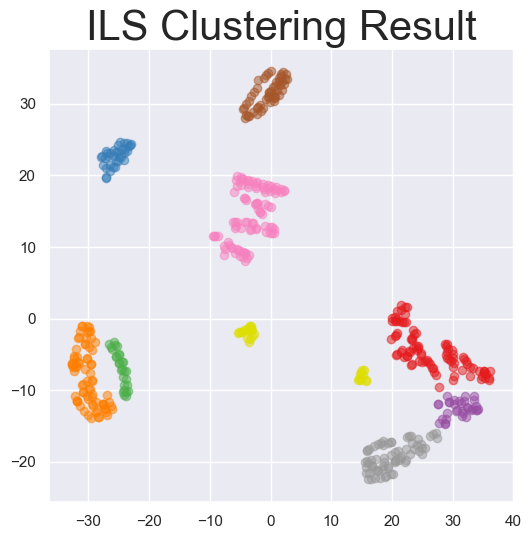

In [295]:
plt.figure(figsize=(6, 6),dpi=100)
for i in range(1, 10):
    plt.scatter(new[new['label'] == i]['x'], new[new['label'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('ILS Clustering Result')

72.2
72.2
48.199999999999996
57.199999999999996
30.2
98.0
100.0
57.199999999999996
Cut height: 0.9967205233297364
Top 9 label data is of 72.2%
[145, 225, 316, 97, 397, 350, 360, 26, 294]
The number of clusters: 9
Iterative label spreading took 1.6s to label 500 points


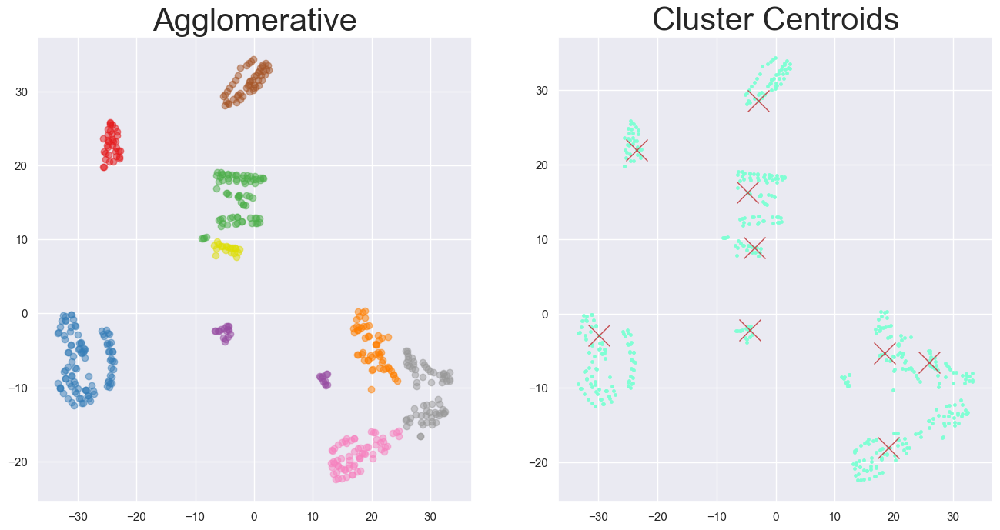

In [18]:
t = nd_data
newL, count, index = test_hc(t, 9, X_embedded_nd)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
X_embedded_nd.index.name = 'ID'
df2 = pd.merge(X_embedded_nd, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(X_embedded_nd['x'], X_embedded_nd['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(X_embedded_nd.loc[i][0], X_embedded_nd.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

78.4
78.4
44.0
58.8
98.4
72.39999999999999
Cut height: 0.29279069079869513
Top 9 label data is of 78.4%
0.36591410636901855
The number of clusters: 9
Iterative label spreading took 0.7s to label 500 points


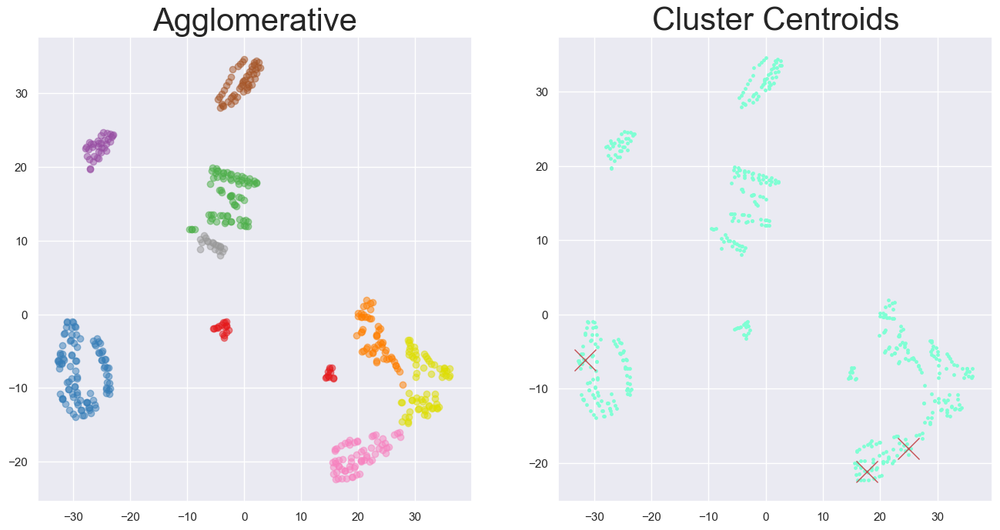

In [250]:
ac, atime = test_hc(nd_data, 9, X_embedded_nd)
newL, count = applyILS(nd_data, ac, atime)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
X_embedded_nd.index.name = 'ID'
df2 = pd.merge(X_embedded_nd, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(X_embedded_nd['x'], X_embedded_nd['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(X_embedded_nd.loc[i][0], X_embedded_nd.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

In [19]:
LS = np.array(df2['LS'])
ILS1 = np.array(df['ILS1'])
print(adjusted_rand_score(ILS1, LS))
LS = np.array(df2['LS'])
ILS2 = np.array(df['ILS2'])
print(adjusted_rand_score(ILS2, LS))
LS = np.array(df2['LS'])
ILS3 = np.array(df['clusterID'])
print(adjusted_rand_score(ILS3, LS))

0.29614036969760127
0.48043569310853607
0.7686356448424245


In [20]:
from sklearn.metrics.cluster import rand_score
LS = np.array(df2['LS'])
ILS1 = np.array(df['ILS1'])
print(rand_score(ILS1, LS))
LS = np.array(df2['LS'])
ILS2 = np.array(df['ILS2'])
print(rand_score(ILS2, LS))
LS = np.array(df2['LS'])
ILS3 = np.array(df['clusterID'])
print(rand_score(ILS3, LS))

0.6664769539078156
0.8405531062124248
0.9472064128256513


In [205]:
scores, density, delta_matrix = pre_calculate(ag_data)

0.21427478217774168
Density caluation time 0.5695199966430664


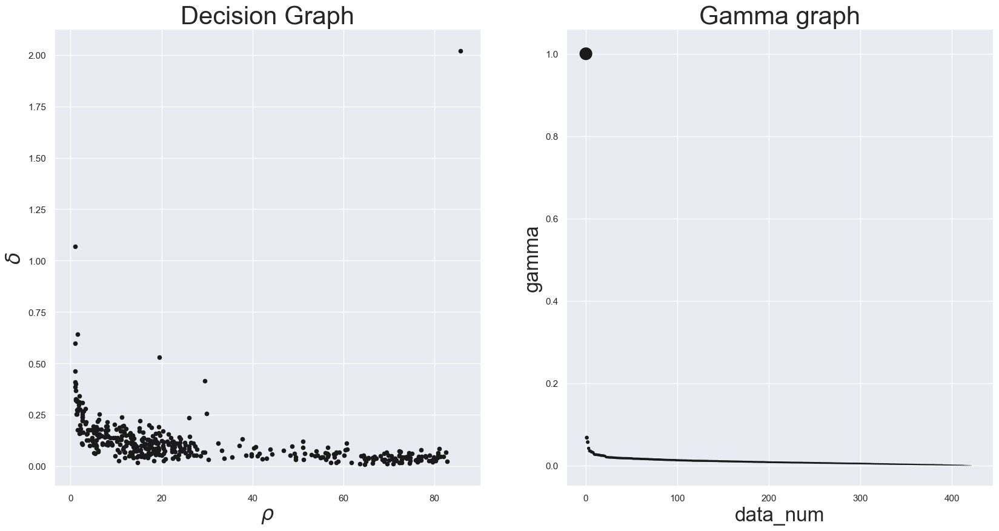

In [209]:
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 10),dpi=100)
ax1 = plt.subplot(121)
for i in range(len(ag_data)):
    plt.scatter(x=density[i], y=delta_matrix[i], c='k', marker='o', s=20)
plt.xlabel(r"$\rho$")
plt.ylabel(r"$\delta$")
plt.title('Decision Graph')
plt.sca(ax1)

ax2 = plt.subplot(122)
gamma = scores
plt.scatter(x=range(len(delta_matrix)), y=-np.sort(-gamma), c='k', marker='o', s=-np.sort(-gamma) * 200)
plt.xlabel('data_num')
plt.ylabel('gamma')
plt.title('Gamma graph')
plt.sca(ax2)
plt.show()

0.21427478217774168
Density caluation time 0.5129482746124268
The number of clusters: 3
Iterative label spreading took 1.3s to label 425 points


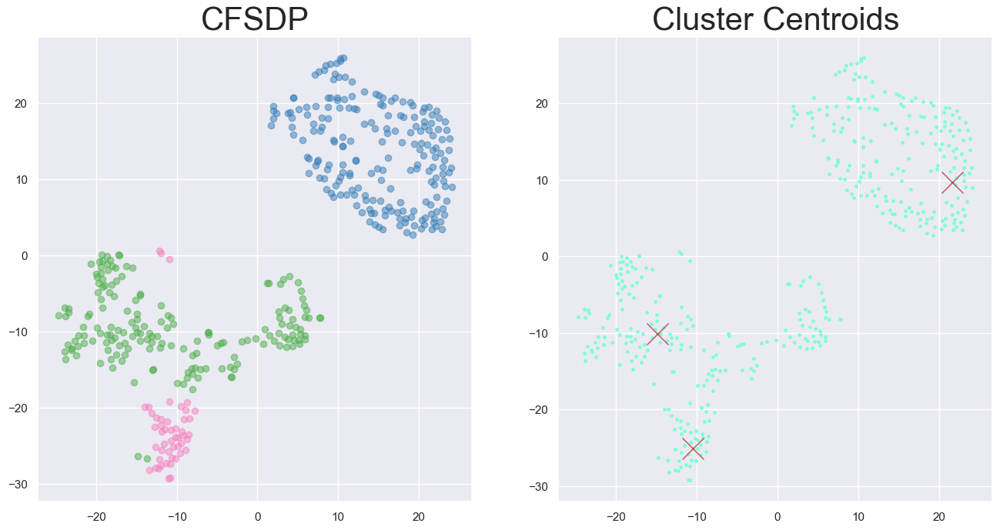

In [210]:
t = ag_data
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
X_embedded_ag.index.name = 'ID'
df2 = pd.merge(X_embedded_ag, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(X_embedded_ag['x'], X_embedded_ag['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(X_embedded_ag.loc[i][0], X_embedded_ag.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

97.6470588235294
85.6470588235294
85.6470588235294
92.47058823529412
92.47058823529412
99.76470588235294
96.0
Cut height: 0.29279069079869513
Top 3 label data is of 92.47058823529412%
[219, 387, 55]
The number of clusters: 3
Iterative label spreading took 1.3s to label 425 points


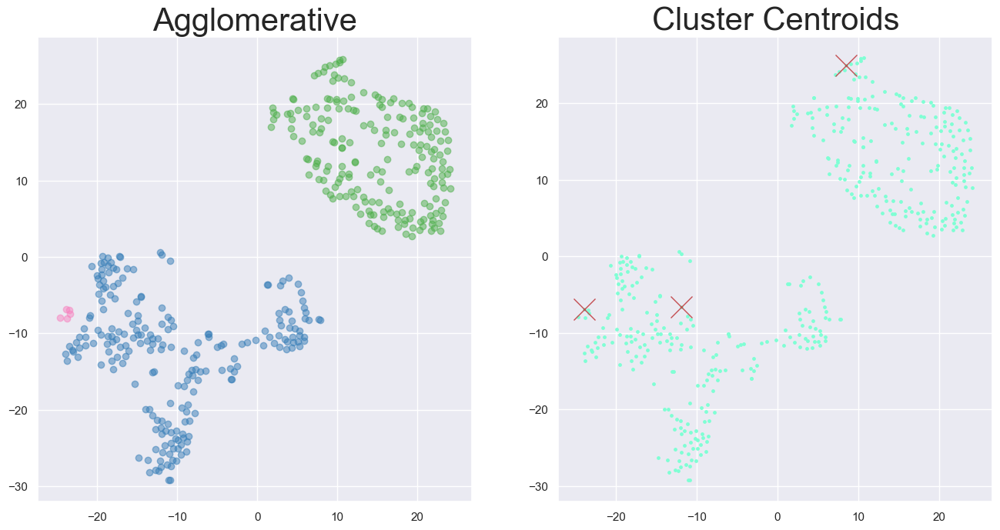

In [213]:
t = ag_data
newL, count, index = test_hc(t, 3, X_embedded_ag)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
X_embedded_ag.index.name = 'ID'
df2 = pd.merge(X_embedded_ag, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(X_embedded_ag['x'], X_embedded_ag['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(X_embedded_ag.loc[i][0], X_embedded_ag.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

In [228]:
def test_hc(dataset, k, X_embedded, low=60, high=95):
    start = time.time()
    Z = hc.get_linkage(dataset, method='single', metric='euclidean')
    label = hc.choose_best_cut(Z, k, low=low, high=high)
    ac, remain = hc.split_data(label, k)
    end = time.time()
    atime = end-start
    print(end-start)
    return ac, atime

In [229]:
ac, atime = test_hc(t, 3, X_embedded_ag)

97.6470588235294
85.6470588235294
85.6470588235294
92.47058823529412
92.47058823529412
99.76470588235294
96.0
Cut height: 0.29279069079869513
Top 3 label data is of 92.47058823529412%
0.5428740978240967


3

In [239]:
def ILS(df, labelColumn, outColumn='LS', iterative=True):
    '''
    @author: amanda.parker@data61.csiro.au
    Citation and implemenatation details : ""

    Apply iterative label spreading in a multi-dimensional feature-space.
    Returns labels for all points and the order-labelled
    and distance-when-labelled for all newly labelled points.
    INPUTS :
        df = pandas dataFrame:
            all features are columns (and only those) +
            one column holding initial labels
        iterative = boolean :
            True : label spreading to unlabelled points applied iteratively
            False : all unlabelled points relabelled with regard to
                    initially labelled set
        labelColumn = String:
            Column name for column that holds initial labels.
            0 = to be labelled
            positive integers = assigned label.
    OUTPUTS :
        pandas dataSeries:
            index : same index input df
            name : outColumn
            data : Labels for all points
                (all values 0 replaced with a positive integer)
        pandas dataFrame:
            Only contains points that were labelled by ILS
            index : same as input df *reordered by order labelled*
            columns:
                minR : distance when relabelled
                IDclosestLabelled : ID of point label recieved from'
     '''

    featureColumns = [i for i in df.columns if i != labelColumn]
    # Keep original index columns in DF
    indexNames = list(df.index.names)
    oldIndex = df.index
    df = df.reset_index(drop=False)

    # separate labelled and unlabelled points
    labelled = [
        group for group in df.groupby(df[labelColumn] != 0)
    ][True][1].fillna(0)
    unlabelled = [
        group for group in df.groupby(df[labelColumn] != 0)
    ][False][1]

    # lists for ordered output data
    outD = []
    outID = []
    closeID = []

    # Continue while any point is unlabelled
    while len(unlabelled) > 0:
        # Calculate labelled to unlabelled distances matrix (D)
        D = pairwise_distances(
            labelled[featureColumns].values,
            unlabelled[featureColumns].values)

        # Find the minimum distance between a labelled and unlabelled point
        # first the argument in the D matrix
        (posL, posUnL) = np.unravel_index(D.argmin(), D.shape)
        # then convert to an index ID in the data frame
        # (The ordering will switch during iterations, more robust)
        idUnL = unlabelled.iloc[posUnL].name
        idL = labelled.iloc[posL].name

        # Switch label from 0 to new label
        unlabelled.loc[idUnL, labelColumn] = labelled.loc[idL, labelColumn]
        # move newly labelled point to labelled dataframe
        labelled = labelled.append(unlabelled.loc[idUnL])
#         labelled.loc[list(unlabelled.loc[idUnL])[0]] = list(unlabelled.loc[idUnL])
        # drop from unlabelled data frame
        unlabelled.drop(idUnL, inplace=True)

        # output the distance and id of the newly labelled point
        outD.append(D.min())
        outID.append(idUnL)
        closeID.append(idL)

    # Throw error if loose or duplicate points
    if len(labelled) + len(unlabelled) != len(df):
        raise Exception(
            '''The number of labelled ({}) and unlabelled ({}) 
                points does not sum to the total ({})'''.format(
                len(labelled), len(unlabelled), len(df)))

    # Reodered index for consistancy
    newIndex = oldIndex[outID]

    orderLabelled = pd.Series(
        data=outD, index=newIndex, name='minR')
    # ID of point label was spread from
    closest = pd.Series(
        data=closeID, index=newIndex, name='IDclosestLabel')
    labelled = labelled.rename(columns={labelColumn: outColumn})
    # new labels as dataseries
    newLabels = labelled.set_index(indexNames)[outColumn]

    # return
    return newLabels, pd.concat([orderLabelled, closest], axis=1)


In [240]:
def applyILS(X, ac, atime):
    '''
    Combined the ILS with the centorid finding, and plot the 2D results
    INPUTS:
        X: the original dataset
        index: the index list of the top k gamma values
    OUTPUTS:
        newL: new labels
        count: cluster number +1
    '''
    df1 = X.copy()
    df1['label'] = 0
    count = 1
    for i in range(len(ac)):
        for j in ac[i]:
            df1.loc[j, 'label'] = count
        count += 1
    print("The number of clusters: " + str(count - 1))
    df1.index.name = 'ID'
    features = [ i for i in df1.columns if i != 'label' ]
    ti = time.time()
    newL, orderedL = ILS(df1[features + ['label']],'label')
    tf = time.time()
    print(
        'Iterative label spreading took {:.1f}s to label {} points'.format( 
        tf-ti+atime, len(X) ))
    return newL, count

97.6470588235294
85.6470588235294
85.6470588235294
92.47058823529412
92.47058823529412
99.76470588235294
96.0
Cut height: 0.29279069079869513
Top 3 label data is of 92.47058823529412%
0.5628979206085205
The number of clusters: 3
Iterative label spreading took 0.6s to label 425 points


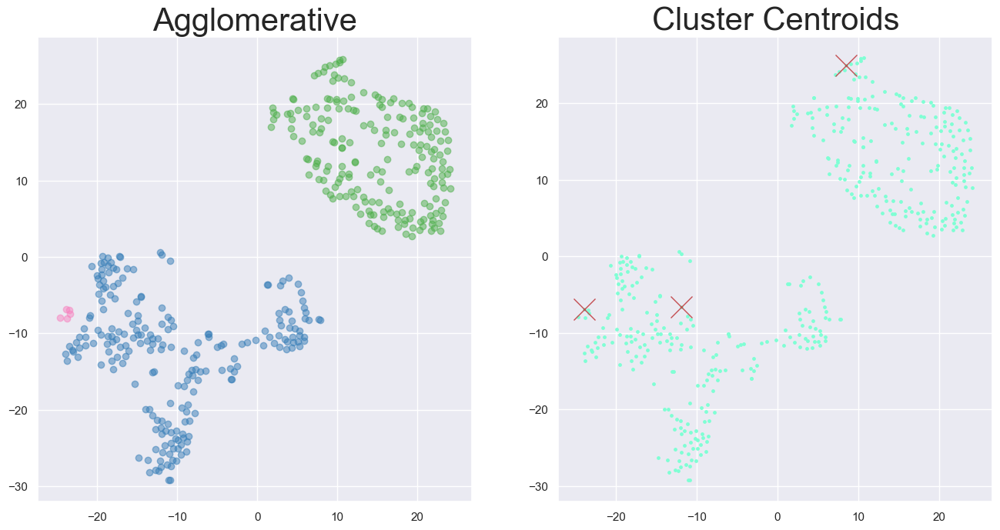

In [244]:
ac, atime = test_hc(t, 3, X_embedded_ag)
newL, count = applyILS(ag_data, ac, atime)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
X_embedded_ag.index.name = 'ID'
df2 = pd.merge(X_embedded_ag, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(X_embedded_ag['x'], X_embedded_ag['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(X_embedded_ag.loc[i][0], X_embedded_ag.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

0.21427478217774168
Density caluation time 0.5715391635894775
The number of clusters: 2
Iterative label spreading took 1.2s to label 425 points
0.21427478217774168
Density caluation time 0.5019292831420898
The number of clusters: 3
Iterative label spreading took 1.2s to label 425 points


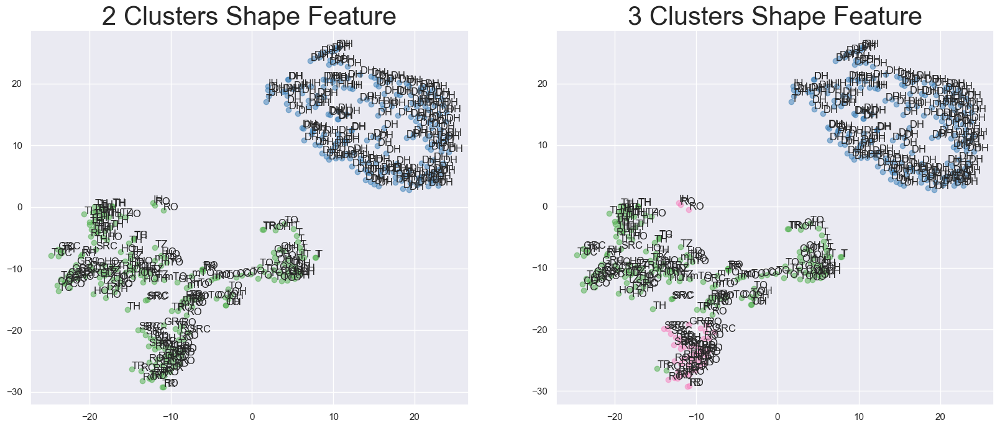

In [165]:
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 8),dpi=100)
ax1 = plt.subplot(121)
t = ag_data
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 2)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
X_embedded_ag.index.name = 'ID'
df2 = pd.merge(X_embedded_ag, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
ax = plt.gca()
for i, txt in enumerate(shape):
    ax.annotate(txt, (X_embedded_ag['x'][i]+0.03, X_embedded_ag['y'][i]+0.03))
plt.title('2 Clusters Shape Feature')
plt.sca(ax1)

ax2 = plt.subplot(122)
t = ag_data
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
X_embedded_ag.index.name = 'ID'
df2 = pd.merge(X_embedded_ag, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
ax = plt.gca()
for i, txt in enumerate(shape):
    ax.annotate(txt, (X_embedded_ag['x'][i]+0.03, X_embedded_ag['y'][i]+0.03))
plt.title('3 Clusters Shape Feature')
plt.sca(ax2)
plt.show()

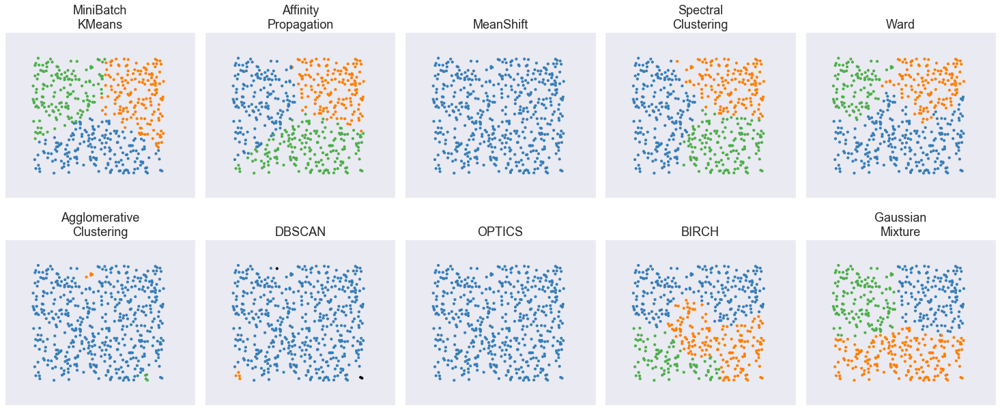

In [273]:
'''
Reference: https://scikit-learn.org/stable/auto_examples/cluster/plot_cluster_comparison.html
'''
import time
import warnings

import numpy as np
import matplotlib.pyplot as plt

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from itertools import cycle, islice

np.random.seed(0)

# ============
# Generate datasets. We choose the size big enough to see the scalability
# of the algorithms, but not too big to avoid too long running times
# ============
n_samples = 500
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=0.5, noise=0.05)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=0.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None

# Anisotropicly distributed data
random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

# blobs with varied variances
varied = datasets.make_blobs(
    n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)

# ============
# Set up cluster parameters
# ============
plt.figure(figsize=(9 * 2 + 3, 8))
plt.subplots_adjust(
    left=0.02, right=0.98, bottom=0.001, top=0.95, wspace=0.05, hspace=0.25
)

plot_num = 1

default_base = {
    "quantile": 0.3,
    "eps": 0.3,
    "damping": 0.9,
    "preference": -200,
    "n_neighbors": 3,
    "n_clusters": 3,
    "min_samples": 7,
    "xi": 0.05,
    "min_cluster_size": 0.1,
}

datasets = [
#     (
#         noisy_circles,
#         {
#             "damping": 0.77,
#             "preference": -240,
#             "quantile": 0.2,
#             "n_clusters": 2,
#             "min_samples": 7,
#             "xi": 0.08,
#         },
#     ),
#     (
#         noisy_moons,
#         {
#             "damping": 0.75,
#             "preference": -220,
#             "n_clusters": 2,
#             "min_samples": 7,
#             "xi": 0.1,
#         },
#     ),
#     (
#         varied,
#         {
#             "eps": 0.18,
#             "n_neighbors": 2,
#             "min_samples": 7,
#             "xi": 0.01,
#             "min_cluster_size": 0.2,
#         },
#     ),
#     (
#         aniso,
#         {
#             "eps": 0.15,
#             "n_neighbors": 2,
#             "min_samples": 7,
#             "xi": 0.1,
#             "min_cluster_size": 0.2,
#         },
#     ),
#     (blobs, {"min_samples": 7, "xi": 0.1, "min_cluster_size": 0.2}),
    (no_structure, {}),
]

for i_dataset, (dataset, algo_params) in enumerate(datasets):
    # update parameters with dataset-specific values
    params = default_base.copy()
    params.update(algo_params)

    X, y = dataset

    # normalize dataset for easier parameter selection
    X = StandardScaler().fit_transform(X)

    # estimate bandwidth for mean shift
    bandwidth = cluster.estimate_bandwidth(X, quantile=params["quantile"])

    # connectivity matrix for structured Ward
    connectivity = kneighbors_graph(
        X, n_neighbors=params["n_neighbors"], include_self=False
    )
    # make connectivity symmetric
    connectivity = 0.5 * (connectivity + connectivity.T)

    # ============
    # Create cluster objects
    # ============
    ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)
    two_means = cluster.MiniBatchKMeans(n_clusters=params["n_clusters"])
    ward = cluster.AgglomerativeClustering(
        n_clusters=params["n_clusters"], linkage="ward", connectivity=connectivity
    )
    spectral = cluster.SpectralClustering(
        n_clusters=params["n_clusters"],
        eigen_solver="arpack",
        affinity="nearest_neighbors",
    )
    dbscan = cluster.DBSCAN(eps=params["eps"])
    optics = cluster.OPTICS(
        min_samples=params["min_samples"],
        xi=params["xi"],
        min_cluster_size=params["min_cluster_size"],
    )
    affinity_propagation = cluster.AffinityPropagation(
        damping=params["damping"], preference=params["preference"]
    )
    average_linkage = cluster.AgglomerativeClustering(
        linkage="average",
        affinity="cityblock",
        n_clusters=params["n_clusters"],
        connectivity=connectivity,
    )
    birch = cluster.Birch(n_clusters=params["n_clusters"])
    gmm = mixture.GaussianMixture(
        n_components=params["n_clusters"], covariance_type="full"
    )

    clustering_algorithms = (
        ("MiniBatch\nKMeans", two_means),
        ("Affinity\nPropagation", affinity_propagation),
        ("MeanShift", ms),
        ("Spectral\nClustering", spectral),
        ("Ward", ward),
        ("Agglomerative\nClustering", average_linkage),
        ("DBSCAN", dbscan),
        ("OPTICS", optics),
        ("BIRCH", birch),
        ("Gaussian\nMixture", gmm),
    )

    for name, algorithm in clustering_algorithms:
        t0 = time.time()

        # catch warnings related to kneighbors_graph
        with warnings.catch_warnings():
            warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the "
                + "connectivity matrix is [0-9]{1,2}"
                + " > 1. Completing it to avoid stopping the tree early.",
                category=UserWarning,
            )
            warnings.filterwarnings(
                "ignore",
                message="Graph is not fully connected, spectral embedding"
                + " may not work as expected.",
                category=UserWarning,
            )
            algorithm.fit(X)

        t1 = time.time()
        if hasattr(algorithm, "labels_"):
            y_pred = algorithm.labels_.astype(int)
        else:
            y_pred = algorithm.predict(X)

        plt.subplot(len(datasets)*2, len(clustering_algorithms)/2, plot_num)
        if i_dataset == 0:
            plt.title(name, size=18)

        colors = np.array(
            list(
                islice(
                    cycle(
                        [
                            "#377eb8",
                            "#ff7f00",
                            "#4daf4a",
                            "#f781bf",
                            "#a65628",
                            "#984ea3",
                            "#999999",
                            "#e41a1c",
                            "#dede00",
                        ]
                    ),
                    int(max(y_pred) + 1),
                )
            )
        )
        # add black color for outliers (if any)
        colors = np.append(colors, ["#000000"])
        plt.scatter(X[:, 0], X[:, 1], s=10, color=colors[y_pred])

        plt.xlim(-2.5, 2.5)
        plt.ylim(-2.5, 2.5)
        plt.xticks(())
        plt.yticks(())
#         plt.text(
#             0.99,
#             0.01,
#             ("%.2fs" % (t1 - t0)).lstrip("0"),
#             transform=plt.gca().transAxes,
#             size=15,
#             horizontalalignment="right",
#         )
        plot_num += 1

plt.show()

In [10]:
def combine_clustering(data, scores, k):
    index = cfs.top_k_idx(scores, k)
    newL, count = cfs.applyILS(data, index)
    return newL, count, index

In [11]:
X = ut.synthetic_data()
colors = np.array(list(islice(cycle(['#837E7C','#377eb8','#4daf4a','#f781bf', '#a65628', 
                                    '#ff7f00','#984ea3','#999999', '#e41a1c', '#dede00',
                                    '#DEB887','#5F9EA0','#7FFF00','#D2691E','#FF7F50',
                                    '#6495ED','#FFF8DC','#DC143C','#00FFFF','#00008B']), int(20))))

0.14999234752441917
Density caluation time 3.0755670070648193
The number of clusters: 2
Iterative label spreading took 8.4s to label 1500 points


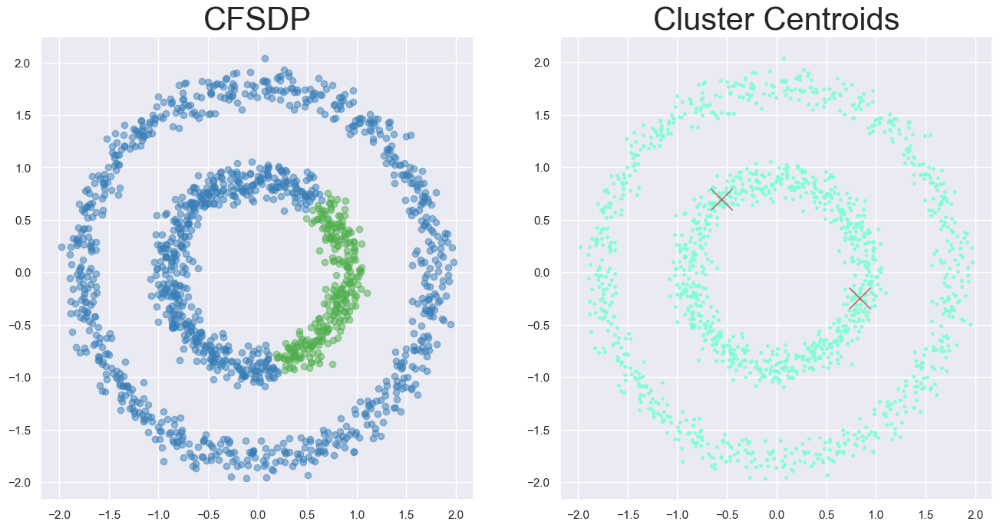

In [129]:
t = X[0]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 2)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

0.08570991287109667
Density caluation time 3.7208411693573
The number of clusters: 2
Iterative label spreading took 9.5s to label 1500 points


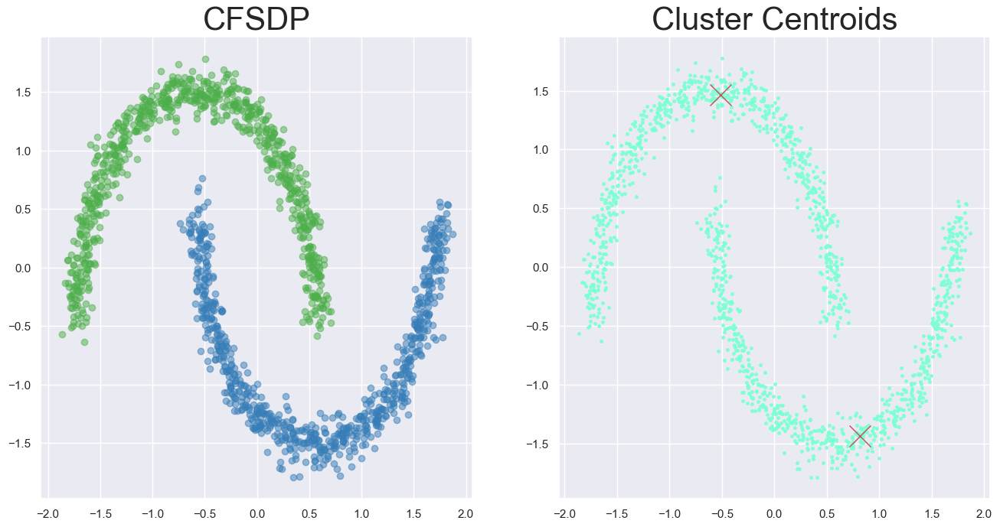

In [114]:
t = X[1]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 2)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

0.17141982574219333
Density caluation time 3.439105987548828
The number of clusters: 3
Iterative label spreading took 9.3s to label 1500 points


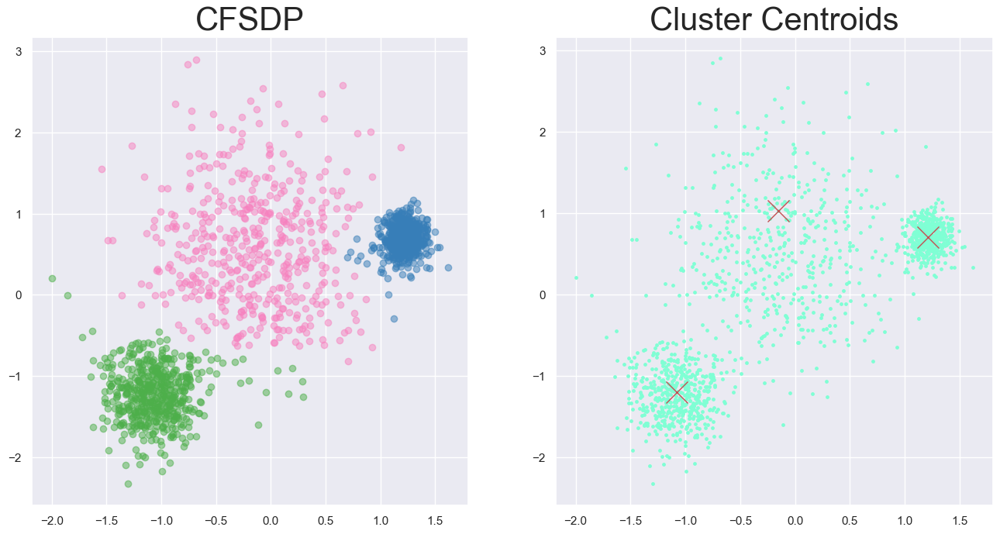

In [115]:
t = X[2]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

0.14999234752441917
Density caluation time 3.790142059326172
The number of clusters: 3
Iterative label spreading took 9.5s to label 1500 points


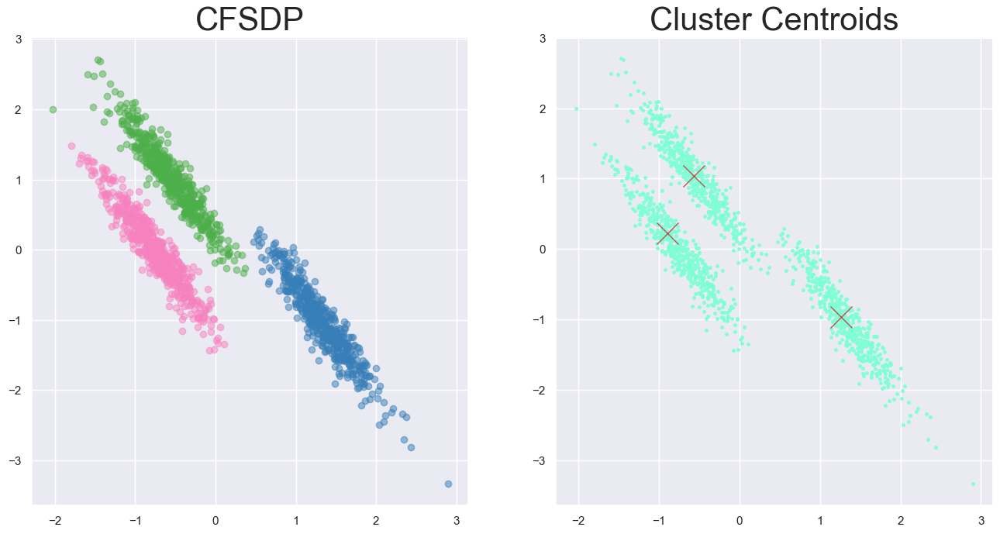

In [116]:
t = X[3]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

0.12856486930664499
Density caluation time 3.8729190826416016
The number of clusters: 3
Iterative label spreading took 10.3s to label 1500 points


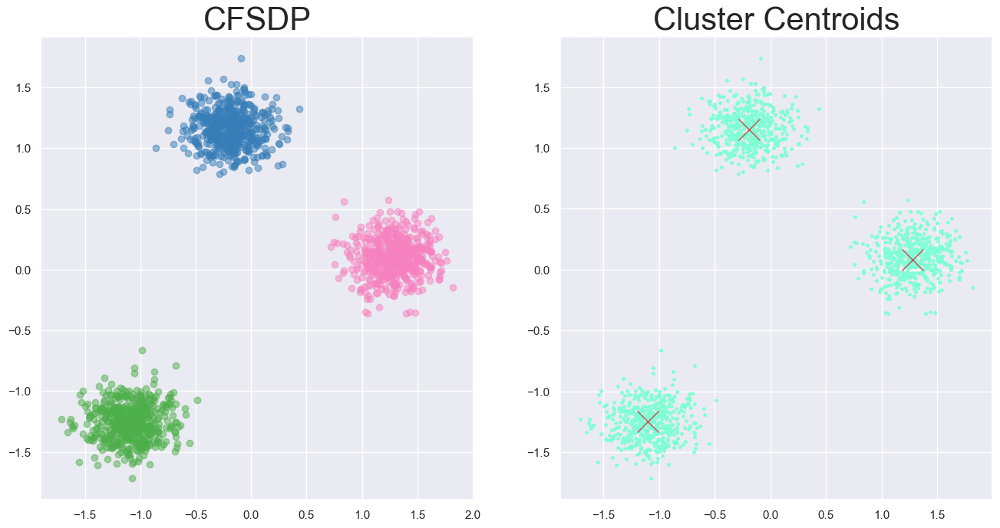

In [117]:
t = X[4]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

0.10713739108887084
Density caluation time 3.128312826156616
The number of clusters: 3
Iterative label spreading took 8.5s to label 1500 points


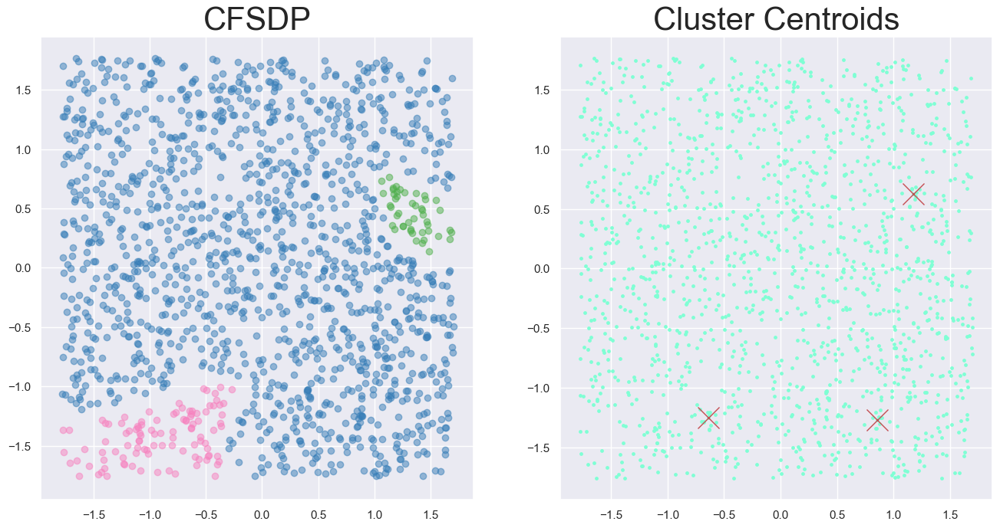

In [130]:
t = X[5]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

100.0
99.93333333333332
100.0
100.0
68.2
68.2
100.0
100.0
100.0
Cut height: 0.9
Top 2 label data is of 68.2%
[1051, 511]
The number of clusters: 2
Iterative label spreading took 8.0s to label 1500 points


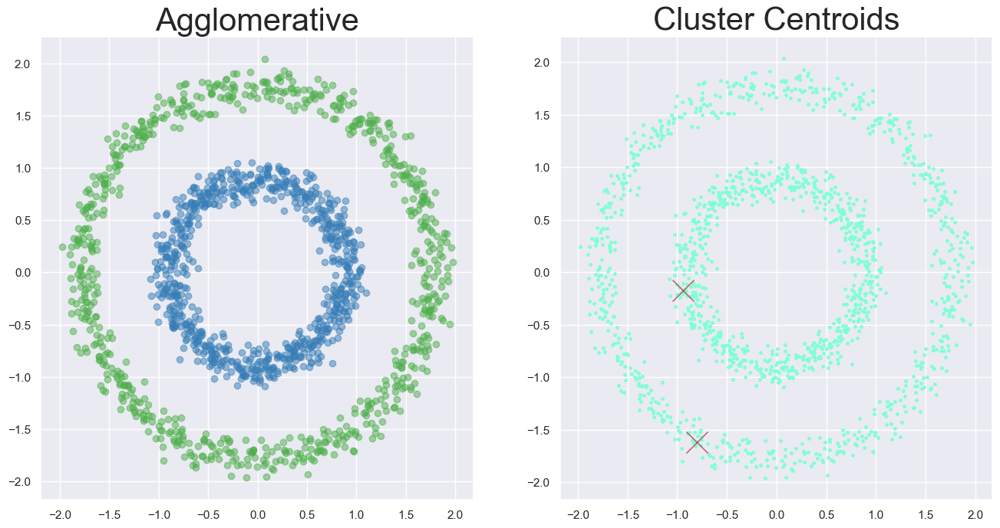

In [143]:
t = X[0]
newL, count, index = test_hc(t, 2, t)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

100.0
100.0
100.0
100.0
99.0
99.0
100.0
100.0
100.0
Cut height: 0.9
Top 2 label data is of 99.0%
[350, 1458]
The number of clusters: 2
Iterative label spreading took 7.8s to label 1500 points


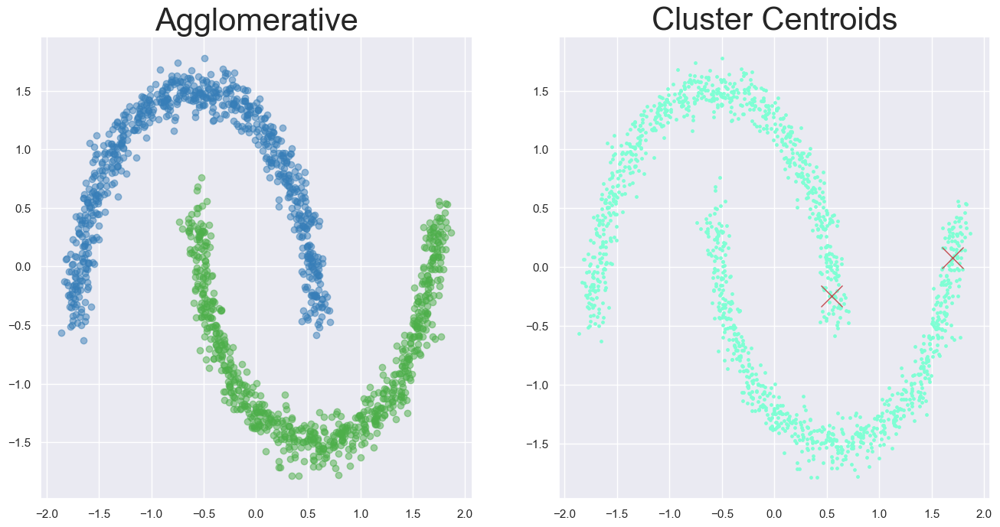

In [144]:
t = X[1]
newL, count, index = test_hc(t, 2, t, high=99.1)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

99.46666666666667
97.39999999999999
98.8
100.0
99.06666666666666
78.60000000000001
78.60000000000001
97.86666666666667
99.2
99.93333333333332
Cut height: 0.9
Top 3 label data is of 78.60000000000001%
[382, 88, 465]
The number of clusters: 3
Iterative label spreading took 8.1s to label 1500 points


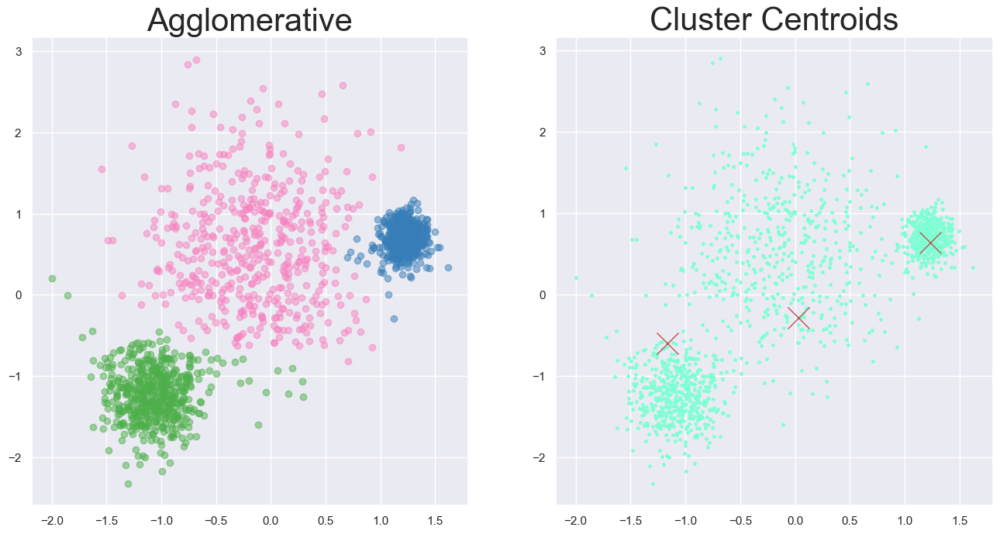

In [145]:
t = X[2]
newL, count, index = test_hc(t, 3, t)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

99.93333333333332
99.73333333333333
99.93333333333332
100.0
99.93333333333332
94.19999999999999
94.19999999999999
99.86666666666667
99.93333333333332
100.0
100.0
Cut height: 0.9
Top 3 label data is of 94.19999999999999%
[1067, 280, 67]
The number of clusters: 3
Iterative label spreading took 8.1s to label 1500 points


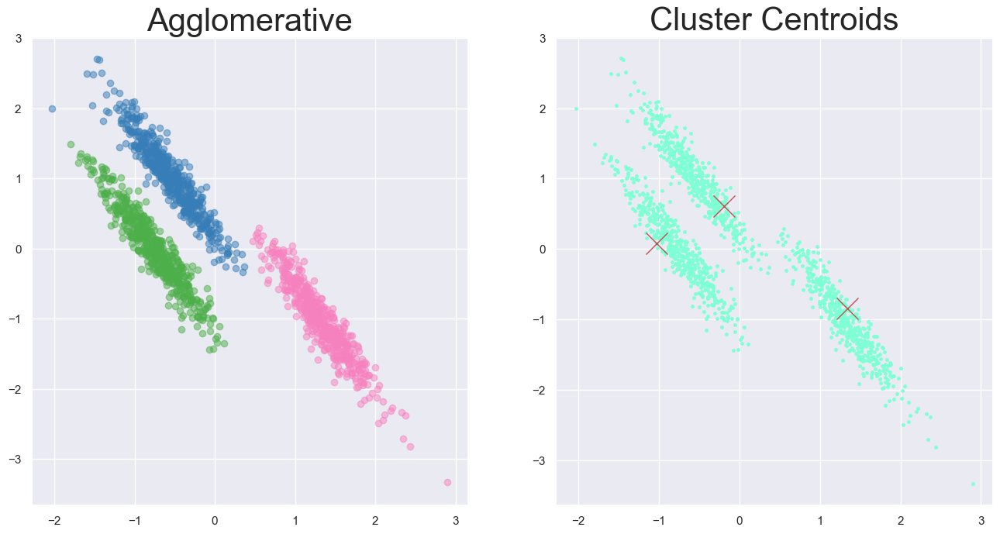

In [146]:
t = X[3]
newL, count, index = test_hc(t, 3, t)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

100.0
99.66666666666667
100.0
100.0
100.0
100.0
98.33333333333333
98.33333333333333
99.8
100.0
100.0
100.0
100.0
Cut height: 0.9
Top 3 label data is of 98.33333333333333%
[193, 205, 1418]
The number of clusters: 3
Iterative label spreading took 8.5s to label 1500 points


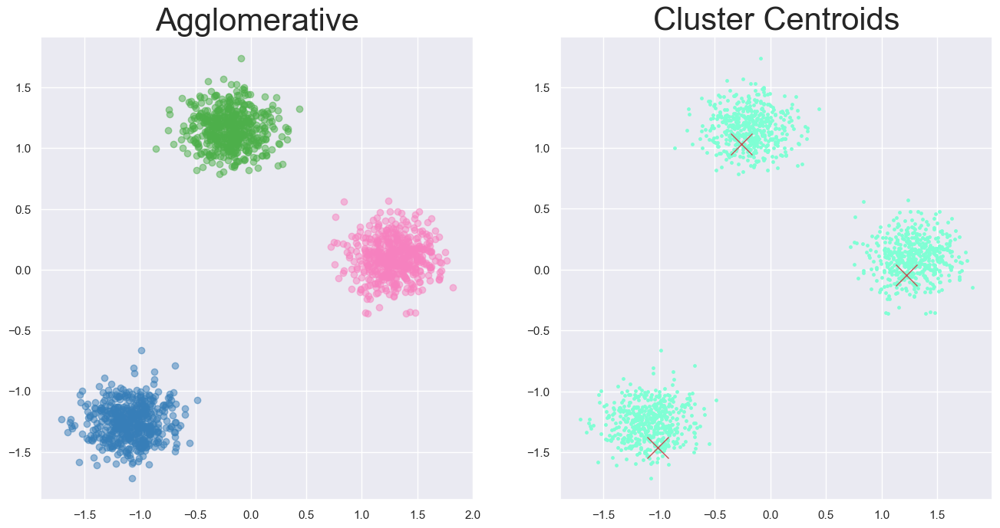

In [147]:
t = X[4]
newL, count, index = test_hc(t, 3, t,high=99)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

33.666666666666664
33.666666666666664
Cut height: 0.9
Top 3 label data is of 33.666666666666664%
[1485, 928, 822]
The number of clusters: 3
Iterative label spreading took 8.7s to label 1500 points


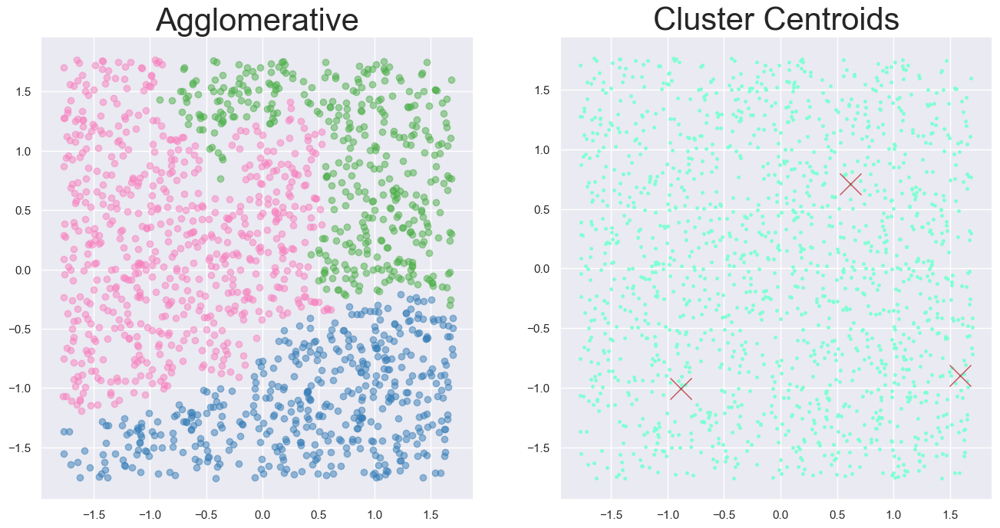

In [148]:
t = X[5]
newL, count, index = test_hc(t, 3, t, low =33)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(121)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

ax2 = plt.subplot(122)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)
plt.show()

0.14999234752441917
Density caluation time 3.0708563327789307
The number of clusters: 2
Iterative label spreading took 8.5s to label 1500 points
100.0
99.93333333333332
100.0
100.0
68.2
68.2
100.0
100.0
100.0
Cut height: 0.9
Top 2 label data is of 68.2%
[964, 935]
The number of clusters: 2
Iterative label spreading took 8.1s to label 1500 points


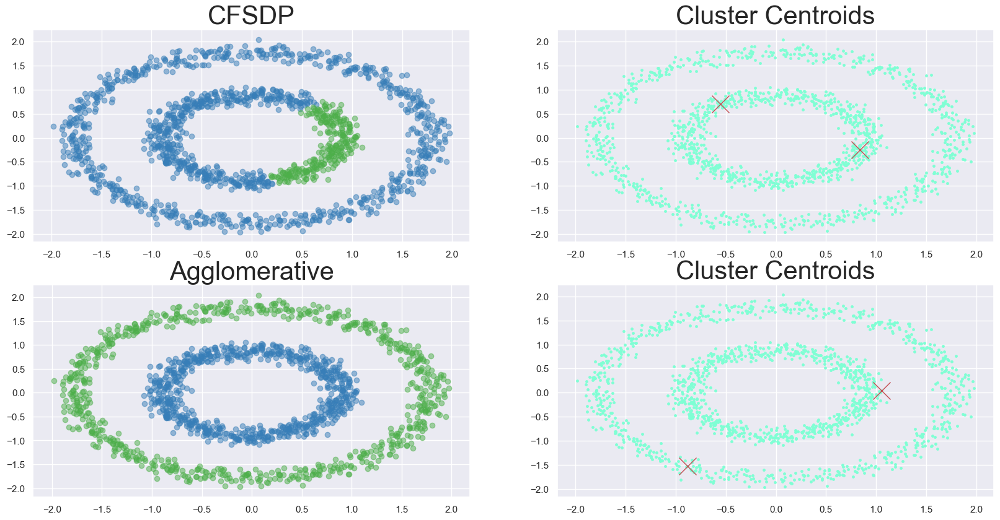

In [283]:
t = X[0]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 2)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 10),dpi=100)
ax1 = plt.subplot(221)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(222)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)

newL, count, index = test_hc(t, 2, t, high=99.1)
ax3 = plt.subplot(223)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax3)

ax4 = plt.subplot(224)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax4)
plt.show()

0.08570991287109667
Density caluation time 3.050204277038574
The number of clusters: 2
Iterative label spreading took 7.9s to label 1500 points
100.0
100.0
100.0
100.0
99.0
99.0
100.0
100.0
100.0
Cut height: 0.9
Top 2 label data is of 99.0%
[173, 327]
The number of clusters: 2
Iterative label spreading took 7.9s to label 1500 points


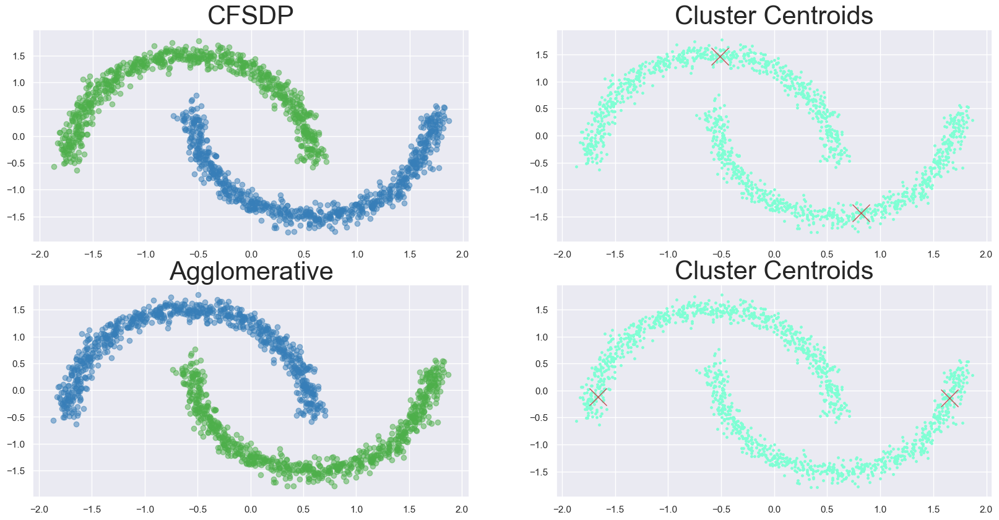

In [282]:
t = X[1]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 2)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 10),dpi=100)
ax1 = plt.subplot(221)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(222)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)

newL, count, index = test_hc(t, 2, t, high=99.1)
ax3 = plt.subplot(223)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax3)

ax4 = plt.subplot(224)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax4)
plt.show()

0.17141982574219333
Density caluation time 2.8869130611419678
The number of clusters: 3
Iterative label spreading took 7.7s to label 1500 points
99.46666666666667
97.39999999999999
98.8
100.0
99.06666666666666
78.60000000000001
78.60000000000001
97.86666666666667
99.2
99.93333333333332
Cut height: 0.9
Top 3 label data is of 78.60000000000001%
[240, 727, 336]
The number of clusters: 3
Iterative label spreading took 7.7s to label 1500 points


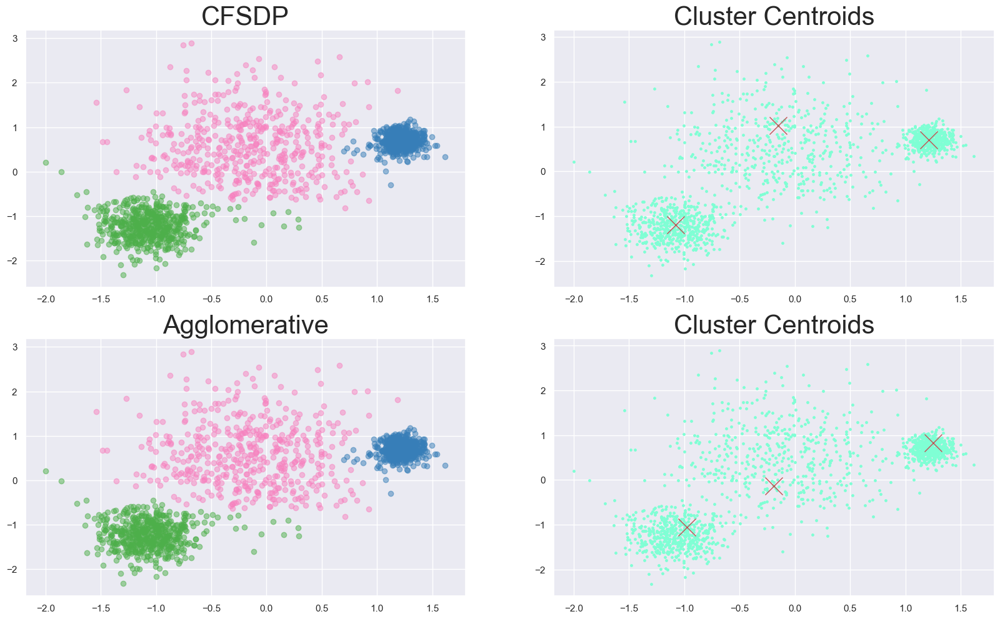

In [277]:
t = X[2]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 12),dpi=100)
ax1 = plt.subplot(221)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(222)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)

newL, count, index = test_hc(t, 3, t)
ax3 = plt.subplot(223)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax3)

ax4 = plt.subplot(224)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax4)
plt.show()

0.14999234752441917
Density caluation time 4.617516994476318
The number of clusters: 3
Iterative label spreading took 10.6s to label 1500 points
99.93333333333332
99.73333333333333
99.93333333333332
100.0
99.93333333333332
94.19999999999999
94.19999999999999
99.86666666666667
99.93333333333332
100.0
100.0
Cut height: 0.9
Top 3 label data is of 94.19999999999999%
[287, 841, 476]
The number of clusters: 3
Iterative label spreading took 10.3s to label 1500 points


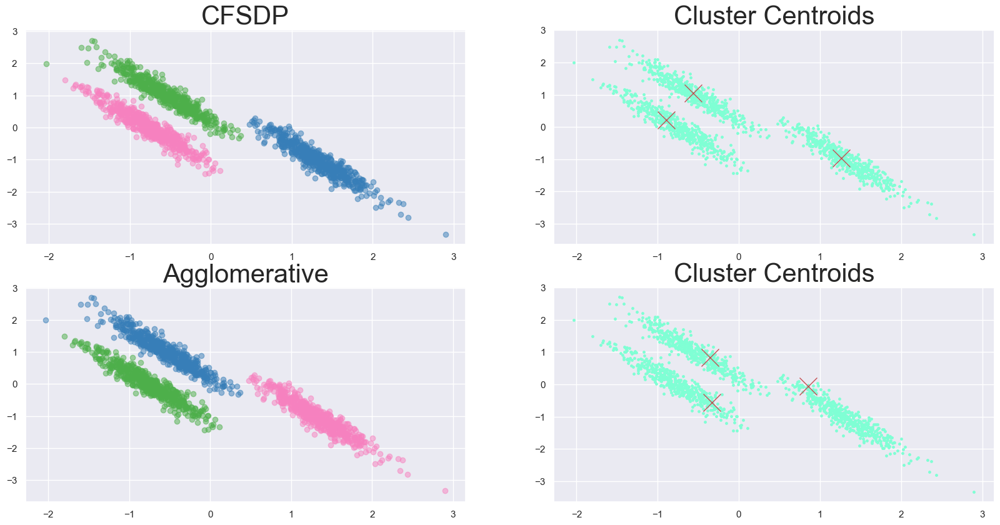

In [196]:
t = X[3]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 10),dpi=100)
ax1 = plt.subplot(221)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(222)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)

newL, count, index = test_hc(t, 3, t, high=99.1)
ax3 = plt.subplot(223)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax3)

ax4 = plt.subplot(224)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax4)
plt.show()

0.12856486930664499
Density caluation time 4.055490970611572
The number of clusters: 3
Iterative label spreading took 10.1s to label 1500 points
100.0
99.66666666666667
100.0
100.0
100.0
100.0
98.33333333333333
98.33333333333333
99.8
100.0
100.0
100.0
100.0
Cut height: 0.9
Top 3 label data is of 98.33333333333333%
[939, 680, 1111]
The number of clusters: 3
Iterative label spreading took 10.3s to label 1500 points


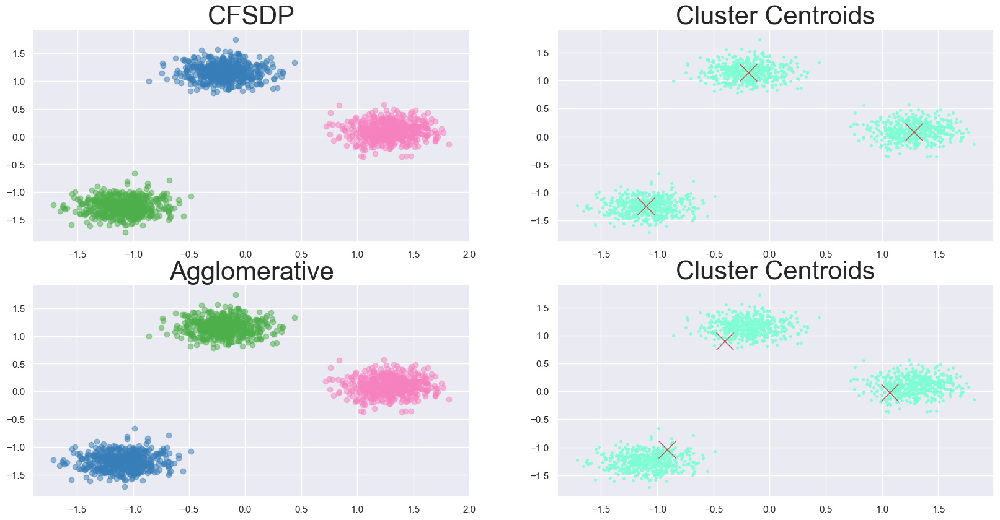

In [197]:
t = X[4]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 10),dpi=100)
ax1 = plt.subplot(221)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(222)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)

newL, count, index = test_hc(t, 3, t, high=99)
ax3 = plt.subplot(223)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax3)

ax4 = plt.subplot(224)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax4)
plt.show()

0.10713739108887084
Density caluation time 4.231385946273804
The number of clusters: 3
Iterative label spreading took 10.6s to label 1500 points
33.666666666666664
33.666666666666664
Cut height: 0.9
Top 3 label data is of 33.666666666666664%
[1331, 1293, 1218]
The number of clusters: 3
Iterative label spreading took 10.8s to label 1500 points


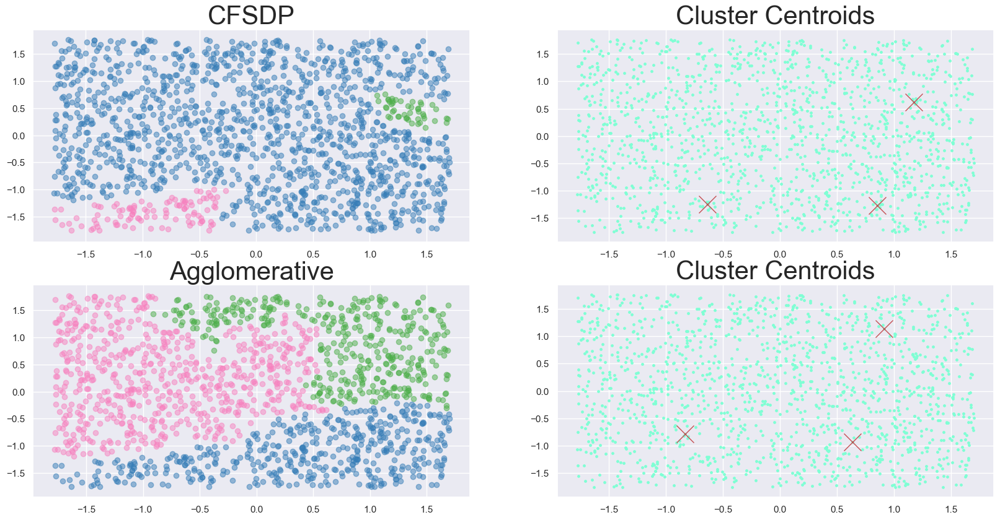

In [198]:
t = X[5]
scores, density, delta_matrix = pre_calculate(t)
newL, count, index = combine_clustering(t, scores, 3)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(20, 10),dpi=100)
ax1 = plt.subplot(221)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('CFSDP')
plt.sca(ax1)

ax2 = plt.subplot(222)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax2)

newL, count, index = test_hc(t, 3, t, low=33)
ax3 = plt.subplot(223)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax3)

ax4 = plt.subplot(224)
plt.scatter(t['x'], t['y'],  marker='o', c='aquamarine', s=6)
for i in index:
    plt.plot(t.loc[i][0], t.loc[i][1], marker='x', c='r', markersize=20)
plt.title('Cluster Centroids')
plt.sca(ax4)
plt.show()

100.0
99.93333333333332
100.0
100.0
68.2
68.2
100.0
100.0
100.0
Cut height: 0.9
Top 2 label data is of 68.2%
3.0904018878936768
The number of clusters: 2
Iterative label spreading took 5.2s to label 1500 points


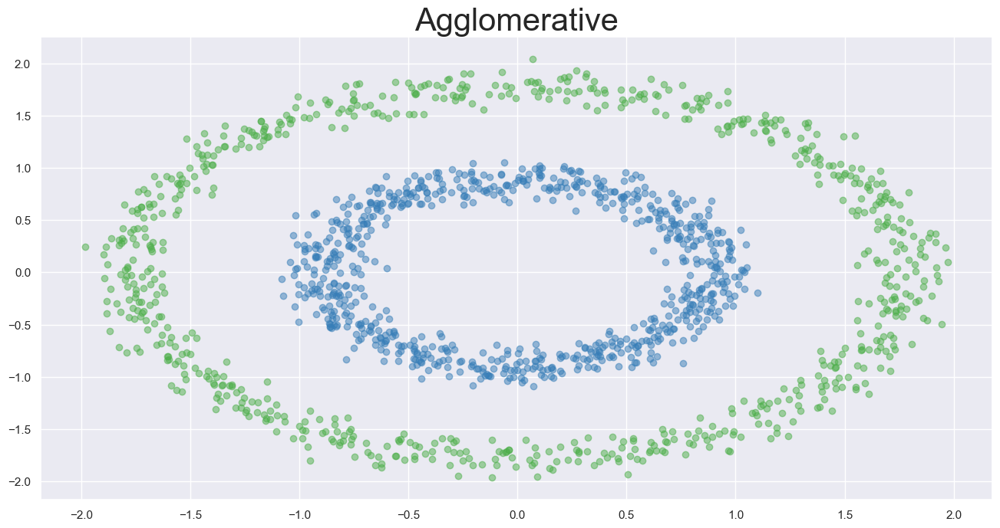

In [252]:
t = X[0]
ac, atime = test_hc(t, 2, t)
newL, count = applyILS(t, ac, atime)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(111)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

100.0
100.0
100.0
100.0
99.0
99.0
100.0
100.0
100.0
Cut height: 0.9
Top 2 label data is of 99.0%
3.101649761199951
The number of clusters: 2
Iterative label spreading took 3.1s to label 1500 points


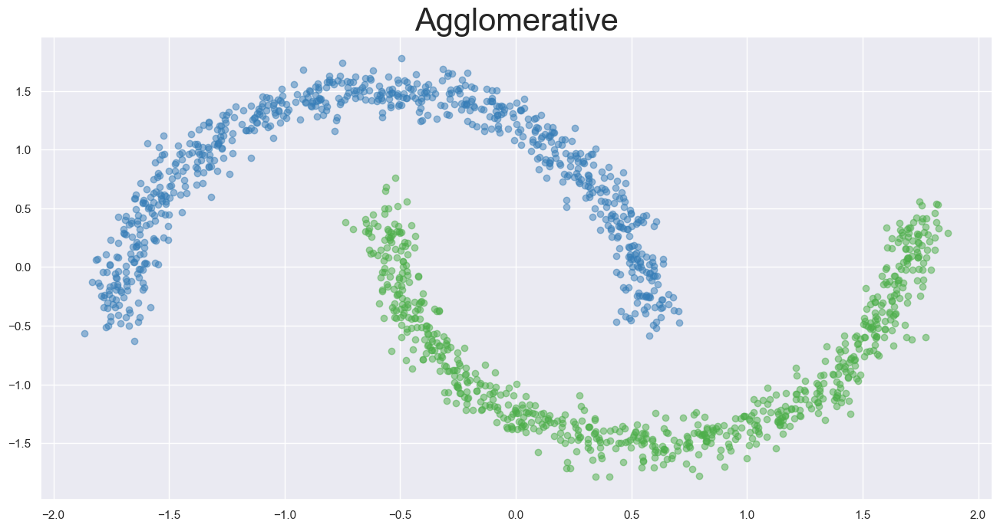

In [253]:
t = X[1]
ac, atime = test_hc(t, 2, t,high=99.1)
newL, count = applyILS(t, ac, atime)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(111)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

99.46666666666667
97.39999999999999
98.8
100.0
99.06666666666666
78.60000000000001
78.60000000000001
97.86666666666667
99.2
99.93333333333332
Cut height: 0.9
Top 3 label data is of 78.60000000000001%
4.803506851196289
The number of clusters: 3
Iterative label spreading took 6.1s to label 1500 points


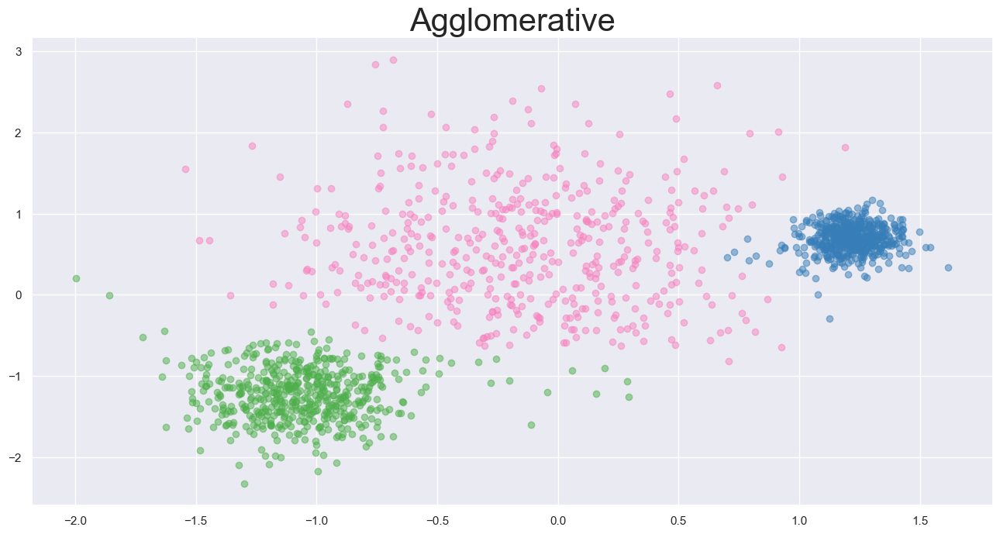

In [255]:
t = X[2]
ac, atime = test_hc(t, 3, t)
newL, count = applyILS(t, ac, atime)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(111)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

99.93333333333332
99.73333333333333
99.93333333333332
100.0
99.93333333333332
94.19999999999999
94.19999999999999
99.86666666666667
99.93333333333332
100.0
100.0
Cut height: 0.9
Top 3 label data is of 94.19999999999999%
3.900063991546631
The number of clusters: 3
Iterative label spreading took 4.2s to label 1500 points


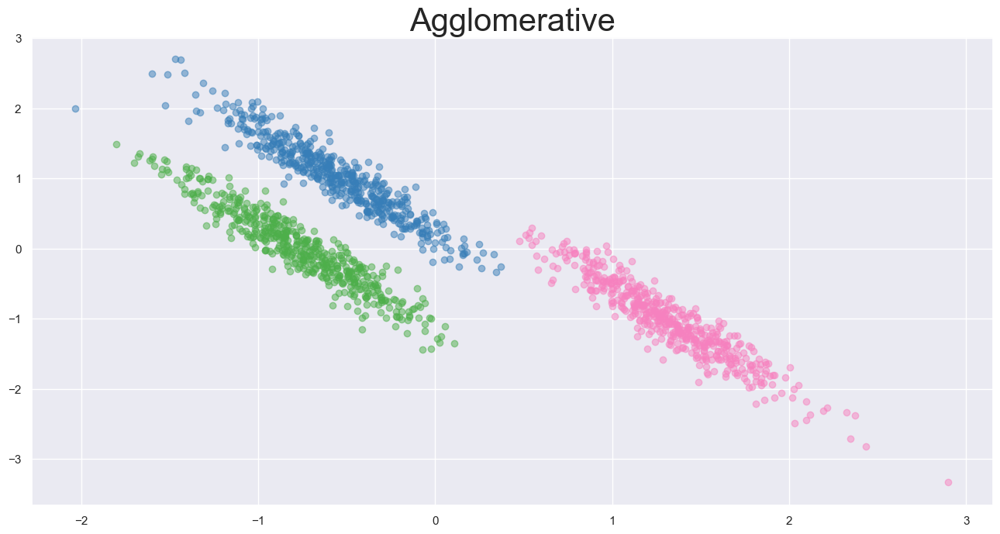

In [257]:
t = X[3]
ac, atime = test_hc(t, 3, t)
newL, count = applyILS(t, ac, atime)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(111)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

100.0
99.66666666666667
100.0
100.0
100.0
100.0
98.33333333333333
98.33333333333333
99.8
100.0
100.0
100.0
100.0
Cut height: 0.9
Top 3 label data is of 98.33333333333333%
3.7698252201080322
The number of clusters: 3
Iterative label spreading took 3.8s to label 1500 points


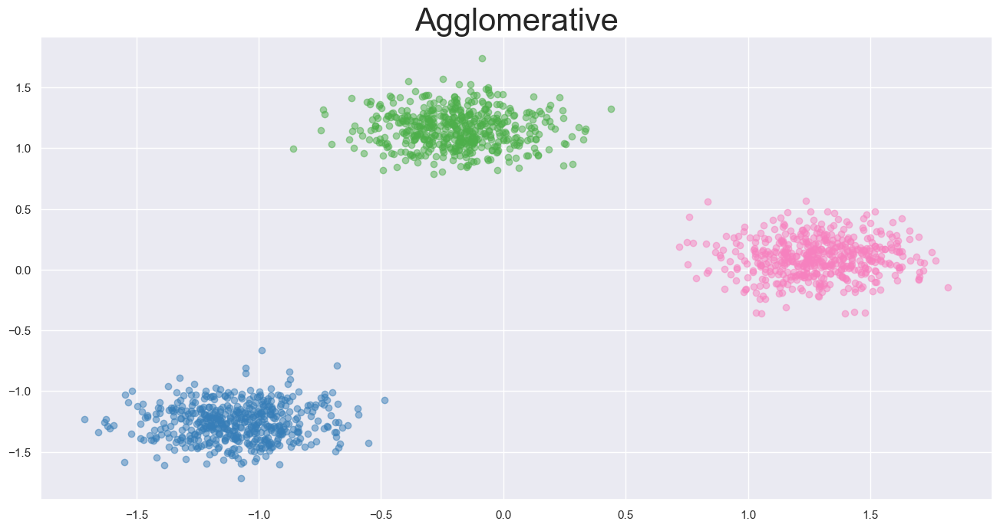

In [258]:
t = X[4]
ac, atime = test_hc(t, 3, t, high=99)
newL, count = applyILS(t, ac, atime)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(111)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)

33.666666666666664
33.666666666666664
Cut height: 0.9
Top 3 label data is of 33.666666666666664%
3.1982810497283936
The number of clusters: 3
Iterative label spreading took 8.4s to label 1500 points


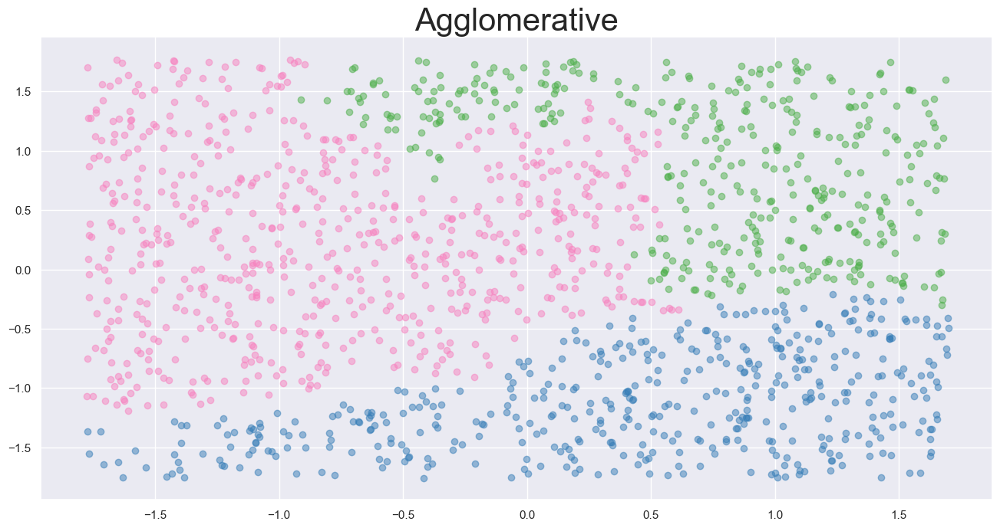

In [261]:
t = X[5]
ac, atime = test_hc(t, 3, t, low=33)
newL, count = applyILS(t, ac, atime)
parameters = {'axes.labelsize': 24,
          'axes.titlesize': 30}
plt.rcParams.update(parameters)
plt.figure(figsize=(16, 8),dpi=100)
ax1 = plt.subplot(111)
L = pd.DataFrame(newL)
L.index = L.index.map(int)
L.LS = L.LS.astype("int") 
t.index.name = 'ID'
df2 = pd.merge(t, L, on = 'ID')
for i in range(1, count):
    plt.scatter(df2[df2['LS'] == i]['x'], df2[df2['LS'] == i]['y'], c=colors[i], alpha=0.5)
plt.title('Agglomerative')
plt.sca(ax1)